In [1]:
%matplotlib inline

import matplotlib.pyplot as plt
import geopandas as gpd
import palettable as pltt
import seaborn as sns
from seaborn import palplot
from shapely.geometry import Point
import pandas as pd
import numpy as np

In [2]:
lsoas_london_link = "../../London_Data/ESRI/LSOA_2011_London_gen_MHW.shp" 
lsoas_london = gpd.read_file(lsoas_london_link)
#keeping only some columns
lsoas_london = lsoas_london[['LSOA11CD','geometry']]
lsoas_london.head()

,LSOA11CD,geometry
0,E01000001,"POLYGON ((532105.0919998939 182011.23, 532162...."
1,E01000002,"POLYGON ((532746.8130000263 181786.891000028, ..."
2,E01000003,"POLYGON ((532135.1449999654 182198.1190000199,..."
3,E01000005,"POLYGON ((533807.9460001207 180767.7700000888,..."
4,E01000006,"POLYGON ((545122.048999952 184314.931000118, 5..."


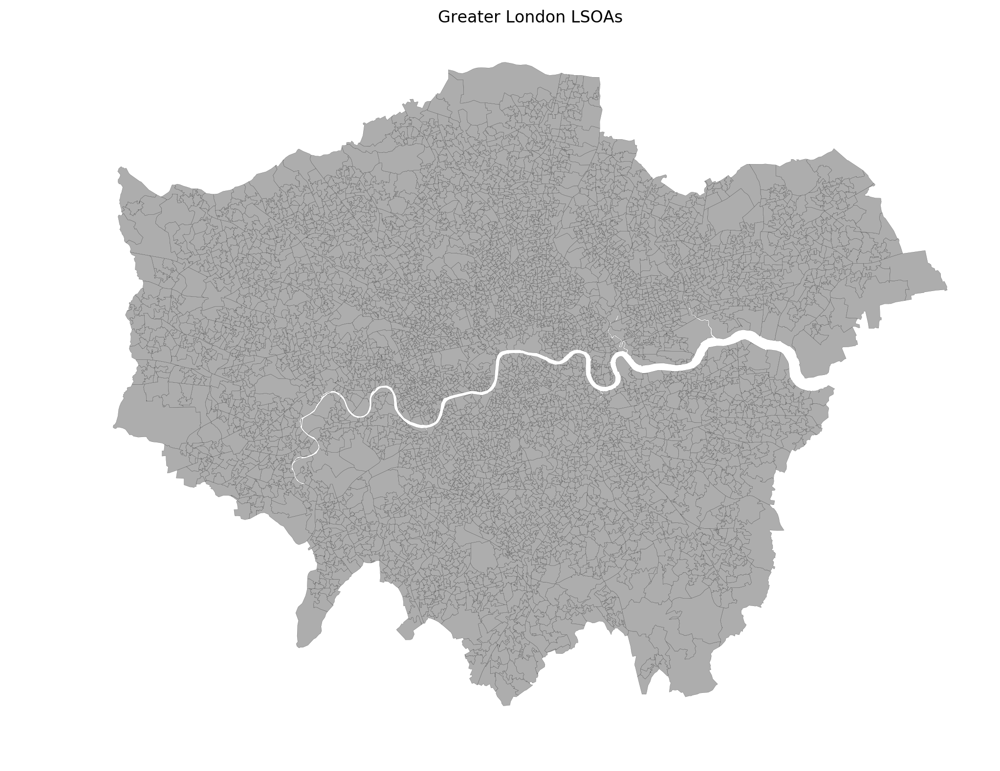

In [11]:
f, ax = plt.subplots(1, figsize=(12., 8.), dpi=200, subplot_kw=dict(aspect='equal'))
ax.axis('off')
lsoas_london.plot(ax=ax, linewidth=0.1, facecolor='#999999', edgecolor='#111111', alpha=0.8)
plt.title('Greater London LSOAs')
plt.tight_layout()

In [3]:
#Reading 3circles data
FILE_NAME = "../../../Data/London_venue_info_v2.csv" 
USE_COLS = ['lat', 'lng', 'category']

#with pandas
df = pd.read_csv(FILE_NAME, delimiter=",", usecols=USE_COLS)
#to geopandas
places_london = gpd.GeoDataFrame(df.drop(['lat', 'lng'], axis=1),
                                 crs={'init': 'epsg:4326'},
                                 geometry=[Point(x, y) for x, y in zip(df.lng, df.lat)])
places_london.head()

,category,geometry
0,Pubs,POINT (-0.1334339549238772 51.51759527965574)
1,Fish & Chips Shops,POINT (-0.06212838758232592 51.53586439687221)
2,Bus Lines,POINT (-0.1030677339855296 51.54342483205862)
3,Mobile Phone Shops,POINT (-0.2215498 51.5091377)
4,French Restaurants,POINT (-0.090007 51.436141)


In [4]:
#setting projection
lsoas_london = lsoas_london.to_crs({'proj': 'tmerc'})
places_london = places_london.to_crs({'proj': 'tmerc'})

['#D5E3D8', '#618A98', '#F9DA95', '#AE4B16', '#787064']


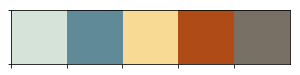

In [70]:
#palette
wes = pltt.wesanderson.Darjeeling2_5.hex_colors
palplot(wes)
print wes

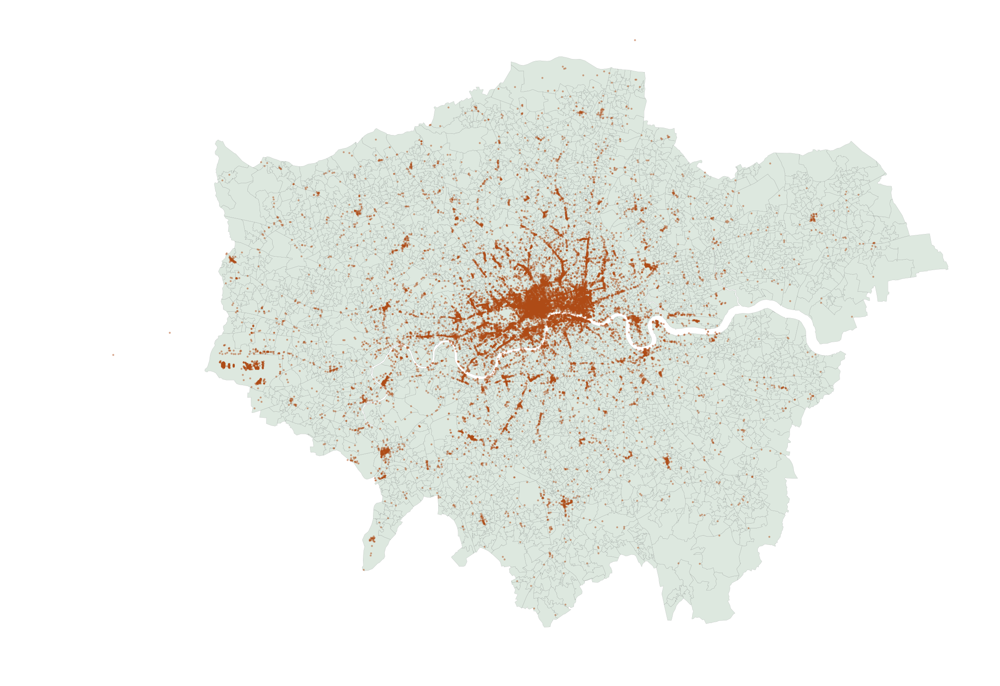

In [10]:
f, ax = plt.subplots(1, figsize=(12., 8.), dpi=200, subplot_kw=dict(aspect='equal'))
ax.axis('off')

lsoas_london.plot(ax=ax, linewidth=0.05, facecolor='#D5E3D8', edgecolor='#111111', alpha=0.8)
places_london.plot(ax=ax, linewidth=0.1, facecolor='#AE4B16', alpha=0.5, edgecolor='#AE4B16', markersize=2)

plt.tight_layout()

plt.savefig('../figures/london_LSOAs_plus_venues.png', dpi=200, transparent=True, tight_layout=True)

In [6]:
#Joining tables
jdf = gpd.sjoin(places_london, lsoas_london, how='right',op='within').reset_index()
jdf = jdf.drop(['index_right', 'index_left'], axis=1)
jdf.head()

,category,LSOA11CD,geometry
0,Libraries,E01000001,POLYGON ((-6640.876131843051 5710060.553200294...
1,Lakes,E01000001,POLYGON ((-6640.876131843051 5710060.553200294...
2,Cocktail Bars,E01000001,POLYGON ((-6640.876131843051 5710060.553200294...
3,Performing Arts Venues,E01000001,POLYGON ((-6640.876131843051 5710060.553200294...
4,Art Galleries,E01000001,POLYGON ((-6640.876131843051 5710060.553200294...


## Counting venues

In [12]:
cat_count = jdf.groupby('LSOA11CD', as_index=False).agg({'category': 'size', 'geometry': 'first'})
cat_count = gpd.GeoDataFrame(cat_count)
#
cat_count['logcatcount'] = np.log10(cat_count['category'])
cat_count.head()

,LSOA11CD,category,geometry,logcatcount
0,E01000001,37,POLYGON ((-6640.876131843051 5710060.553200294...,1.568202
1,E01000002,77,POLYGON ((-6005.346420705409 5709818.696488084...,1.886491
2,E01000003,10,POLYGON ((-6605.717354470359 5710246.601913924...,1.000000
3,E01000005,36,"POLYGON ((-4972.16861708077 5708770.679791695,...",1.556303
4,E01000006,1,"POLYGON ((6437.580467144002 5712008.123041059,...",0.000000


/Users/iacopo/.pyenv/versions/2.7.10/envs/jupytervenv/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


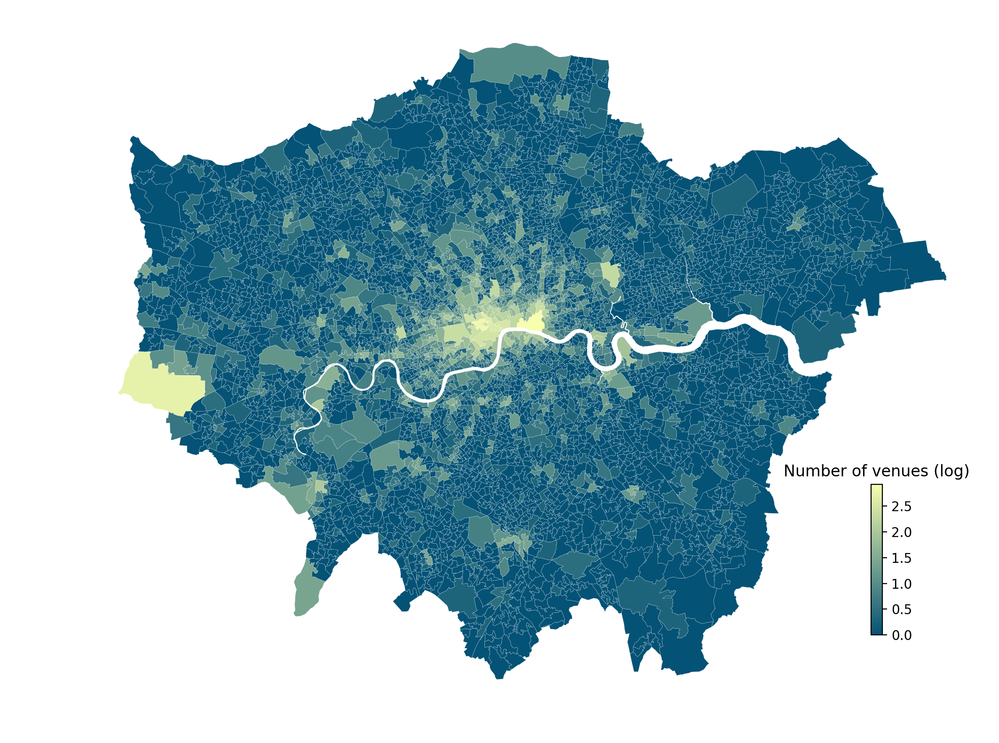

In [14]:
f, ax = plt.subplots(1, figsize=(12., 8.), dpi=200, subplot_kw=dict(aspect='equal'))
ax.axis('off')

#plotting
im = cat_count.plot(
    ax=ax,
    column='logcatcount', 
    k=7, 
    cmap= pltt.cartocolors.sequential.BluYl_2_r.mpl_colormap,
    alpha=1, 
    edgecolor='w', 
    linewidth=0.1, 
    legend=False, 
    antialiased=True)

#fixing colorbar
vmin = cat_count.logcatcount.min()
vmax = cat_count.logcatcount.max()
cax = f.add_axes([0.8, 0.15, 0.01, 0.2])
sm = plt.cm.ScalarMappable(cmap=pltt.cartocolors.sequential.BluYl_2_r.mpl_colormap,
                           norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cbr = f.colorbar(sm, cax=cax)
cbr.ax.tick_params(labelsize=10)

plt.title('Number of venues (log)')
plt.tight_layout()

plt.savefig('../figures/london_LSOAs_nvenues.png', dpi=200, transparent=True, tight_layout=True)

## Entropy of categories 

Not normalised by number of venues, so
$S([a,b,c])<S([a,b,c,d])$

In [44]:
from collections import Counter

def get_entropy(categories):
    sList = list(categories)
    alphabet = list(set(sList)) # list of unique symbols 
    #frequencies of symbols 
    freqList = Counter(sList).values()
    #normalising frequencies
    freqList = [1.*f/len(sList) for f in freqList]
    ent = 0.0
    for f in freqList:
        ent = ent + f*np.log(f)
    if ent!= 0:
        ent = -ent
    return ent

In [56]:
entropies_df = pd.DataFrame(columns=['entropy','norm_entropy','LSOA11CD','geometry'])

for lsoa in jdf['LSOA11CD'].unique():
    categories = jdf[jdf['LSOA11CD']==lsoa].category.values
    #computing entropy
    en = get_entropy(categories)
    #normalising by number of venues in the lsoa
    norm_en = en/len(categories)
    entropies_df = entropies_df.append({'entropy':en, 'norm_entropy':norm_en, 'LSOA11CD':lsoa,
                                        'geometry':jdf[jdf['LSOA11CD']==lsoa].head(1)['geometry'].values[0]},
                                        ignore_index=True)
#converting to gdf
entropies_gdf = gpd.GeoDataFrame(entropies_df)
entropies_gdf.head()

,entropy,norm_entropy,LSOA11CD,geometry
0,2.945688,0.079613,E01000001,POLYGON ((-6640.876131843051 5710060.553200294...
1,3.555698,0.046178,E01000002,POLYGON ((-6005.346420705409 5709818.696488084...
2,2.302585,0.230259,E01000003,POLYGON ((-6605.717354470359 5710246.601913924...
3,2.775345,0.077093,E01000005,"POLYGON ((-4972.16861708077 5708770.679791695,..."
4,1.386294,0.346574,E01000007,"POLYGON ((5506.549171801797 5712419.466031407,..."


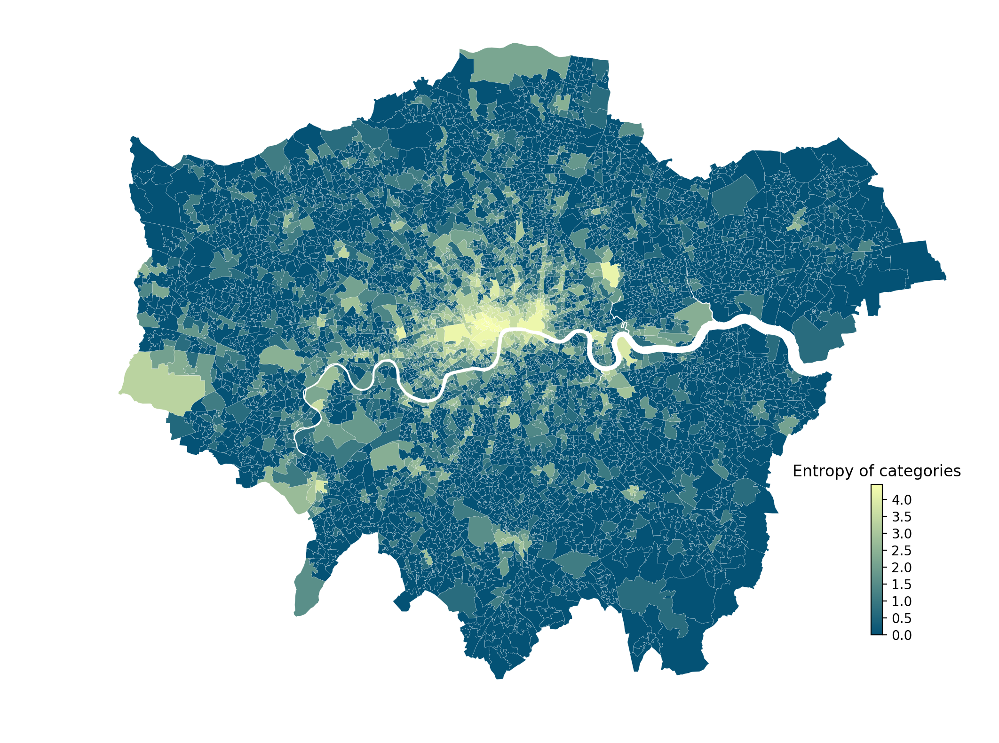

In [64]:
f, ax = plt.subplots(1, figsize=(12., 8.), dpi=200, subplot_kw=dict(aspect='equal'))
ax.axis('off')

#plotting
im = entropies_gdf.plot(
    ax=ax,
    column='entropy', 
    k=7, 
    cmap= pltt.cartocolors.sequential.BluYl_2_r.mpl_colormap,
    alpha=1, 
    edgecolor='w', 
    linewidth=0.1, 
    legend=False, 
    antialiased=True)

#fixing colorbar
vmin = entropies_gdf.entropy.min()
vmax = entropies_gdf.entropy.max()
cax = f.add_axes([0.8, 0.15, 0.01, 0.2])
sm = plt.cm.ScalarMappable(cmap=pltt.cartocolors.sequential.BluYl_2_r.mpl_colormap,
                           norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cbr = f.colorbar(sm, cax=cax)
cbr.ax.tick_params(labelsize=10)

plt.title('Entropy of categories')
plt.tight_layout()

plt.savefig('../figures/london_LSOAs_entropy.png', dpi=200, transparent=True, tight_layout=True)

In [66]:
x_count=[]
y_en=[]

for lsoa in jdf['LSOA11CD'].unique():
    categories = jdf[jdf['LSOA11CD']==lsoa].category.values
    #computing entropy
    en = get_entropy(categories)
    
    x_count.append(len(categories))
    y_en.append(en)

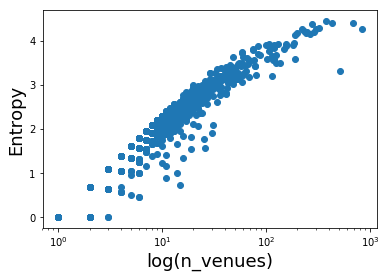

In [72]:
plt.scatter(x_count,y_en)
plt.xscale('log')
plt.xlabel('log(n_venues)', size=18)
plt.ylabel('Entropy', size=18);

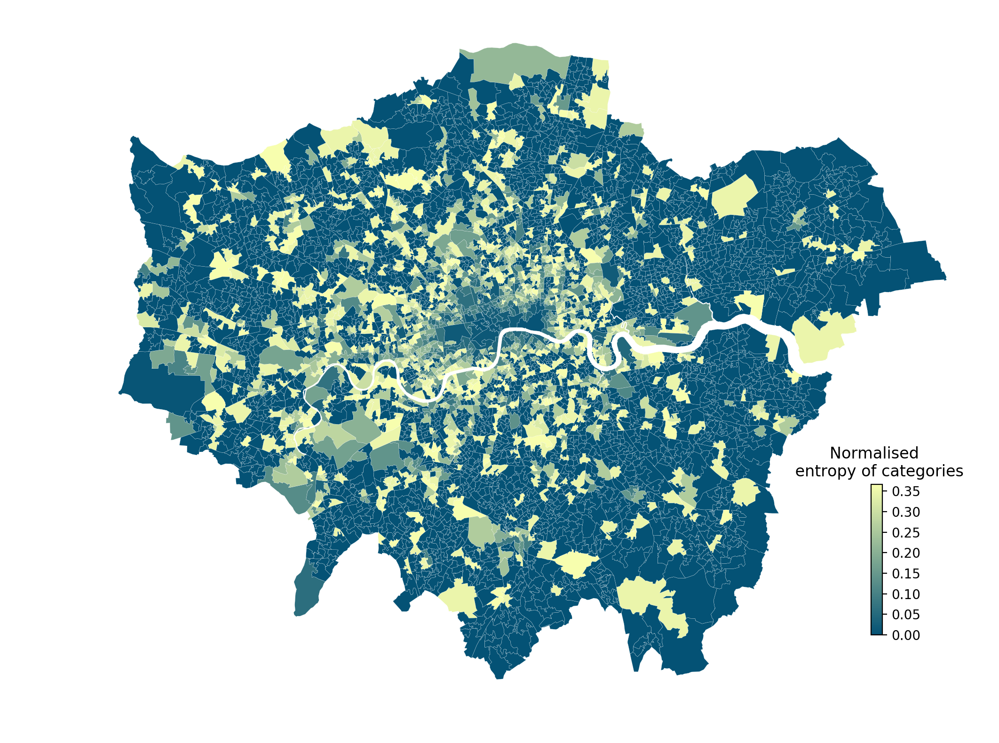

In [63]:
f, ax = plt.subplots(1, figsize=(12., 8.), dpi=200, subplot_kw=dict(aspect='equal'))
ax.axis('off')

#plotting
im = entropies_gdf.plot(
    ax=ax,
    column='norm_entropy', 
    k=7, 
    cmap= pltt.cartocolors.sequential.BluYl_2_r.mpl_colormap,
    alpha=1, 
    edgecolor='w', 
    linewidth=0.1, 
    legend=False, 
    antialiased=True)

#fixing colorbar
vmin = entropies_gdf.norm_entropy.min()
vmax = entropies_gdf.norm_entropy.max()
cax = f.add_axes([0.8, 0.15, 0.01, 0.2])
sm = plt.cm.ScalarMappable(cmap=pltt.cartocolors.sequential.BluYl_2_r.mpl_colormap,
                           norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cbr = f.colorbar(sm, cax=cax)
cbr.ax.tick_params(labelsize=10)

plt.title('Normalised \n entropy of categories')
plt.tight_layout()

plt.savefig('../figures/london_LSOAs_norm_entropy.png', dpi=200, transparent=True, tight_layout=True)